# Comparative Analysis of Pedestrian Dynamics Models

> **Local CrowdRL copy** of the upstream JuPedSim notebook
> [model-comparison](https://www.jupedsim.org/stable/notebooks/model-comparison.html):
> every scenario additionally runs our learned operational model
> (**CrowdRL**, `example_model/policy_r0125.onnx`).

## Objective

This notebook compares four pedestrian dynamics models by simulating agent behavior in a  
structured environment. Using simplified scenarios, we analyze how each model handles  
navigation, obstacle avoidance, and agent interactions. This comparison reveals the strengths  
and weaknesses of each approach, helping inform model selection when using JuPedSim.

When choosing a pedestrian dynamics model in JuPedSim, the decision largely depends on the  
specific scenario you want to simulate or the behavior you want to reproduce. The available  
models can be divided into two main categories: **force-based** and **velocity-based** models,  
each with their own strengths and limitations.

### Force-Based Models

Force-based models, which include the **Social Force Model (SFM)** and the **Generalized  
Centrifugal Force Model (GCFM)**, excel at simulating physical interactions between pedestrians.  
These models are particularly effective at capturing pushing behavior in dense crowds, making  
them ideal for evacuation scenarios or situations where physical contact between pedestrians  
is common. The **GCFM** offers some improvements over the basic **SFM**, particularly in handling  
body shape effects.

### Velocity-Based Models

On the other hand, velocity-based models like the **Collision-Free Model (CFM)** and the  
**Anticipation Velocity Model (AVM)** are better suited for normal walking situations where  
collision avoidance is the primary concern. These models typically produce smoother, more  
realistic trajectories in regular-density scenarios. The **AVM**, in particular, stands out for  
its superior collision avoidance capabilities and ability to reproduce lane formation behavior,  
as demonstrated in [recent research](https://doi.org/10.1016/j.trc.2021.103464).

### Computational Efficiency

When it comes to computational efficiency, velocity-based models generally have an advantage.  
The **CFM** offers the fastest execution times, while the **AVM** provides a good balance between  
computational efficiency and realistic behavior simulation. Force-based models, while more  
computationally intensive, are necessary when accurate physical interaction modeling is crucial.

### Model Selection Guidance

The choice of model ultimately comes down to your specific requirements:

- **Force-based models (SFM, GCFM):** Best for emergency evacuations or crowded environments  
  with significant physical interactions.  
- **Velocity-based models (AVM):** Ideal for typical pedestrian scenarios requiring smooth  
  navigation and realistic avoidance behavior.  
- **Collision-Free Model (CFM):** Suitable when computational resources are limited and  
  physical interactions are not critical.  

The key is to understand that no single model is universally superior—each has its place  
depending on the specific requirements of your simulation scenario.

**So as a final facit, which model to use? The answer is: it depends.**

## Models Under Investigation

In this notebooks the models compared are:

1. [**Collision-Free Speed Model (CSM):**](https://pedestriandynamics.org/models/collision_free_speed_model/)  
   A velocity-based model focused on ensuring agents move without collisions  
  by dynamically adjusting their speeds.

2. [**Anticipation Velocity Model (AVM):**](https://doi.org/10.1016/j.trc.2021.103464)  
   A model that incorporates anticipation and reaction times, allowing agents  
  to predict and avoid potential collisions.

3. [**Social Force Model (SFM):**](https://pedestriandynamics.org/models/social_force_model/)
   A force-based model where agents are influenced   
   by attractive forces toward goals and repulsive forces 
   from obstacles and other agents.

4. [**Generalized Centrifugal Force Model (GCFM):**](https://pedestriandynamics.org/models/generalized_centrifugal_force_model/)  
   An enhanced force-based model where agents experience centrifugal forces  
  to better simulate realistic avoidance behavior.

5. [**Warp Driver (WD):**](https://www.jupedsim.org/stable/pedestrian_models/warp_driver_model.html)  
  The WarpDriver model computes collision-free velocities using **probabilistic collision fields**.

6. **CrowdRL Learned Policy (CrowdRL):**  
   This repo's MARL-trained operational model (`example_model/policy_r0125.onnx`), deployed through
   `crowdrl_jupedsim.LearnedPolicyModel` -- a JuPedSim 2.0 custom operational model. Sensing,
   observation build, ONNX policy inference, action interpretation and contact physics all run in
   the adapter; JuPedSim supplies geometry, routing (`next_target`) and agent lifecycle.

> **Note:**  
> All models are utilized with their default parameter settings as defined in **JuPedSim**.  
> The CrowdRL model self-configures from the metadata embedded in its `.onnx` artefact.  
> For this comparison its commanded speed is additionally clamped per agent to the
> scenario's desired speed -- see the "speed clamp" note before Scenario 1.

In [1]:
import pathlib

import jupedsim as jps
import matplotlib.pyplot as plt
import numpy as np
import pedpy
from jupedsim.internal.notebook_utils import animate, read_sqlite_file
from shapely import Polygon
from shapely.geometry import Point
from shapely.ops import unary_union

import plotly.io as pio

from crowdrl_jupedsim import CrowdRLAgentState, LearnedPolicyModel, OnnxPolicy

# Keep plotly outputs small and renderable in VS Code / JupyterLab (the
# upstream notebook relies on the docs-build renderer).
pio.renderers.default = "plotly_mimetype"

# The learned CrowdRL policy (see example_model/README.md). The artefact is
# schema v2: obs/action configs and dynamics self-configure from its
# embedded metadata.
POLICY_PATH = pathlib.Path("..") / "example_model" / "policy_r0125.onnx"

# Trajectory sqlite files land in the gitignored outputs/ tree.
OUT_DIR = pathlib.Path("outputs") / "11_model_comparison"
OUT_DIR.mkdir(parents=True, exist_ok=True)



def initialize_simulation(
    model, state_type, geometry, goals, positions, speeds, trajectory_file
):
    pathlib.Path(trajectory_file).unlink(missing_ok=True)
    simulation = jps.Simulation(
        model=model,
        geometry=geometry,
        dt=0.01,
        trajectory_writer=jps.SqliteTrajectoryWriter(
            output_file=pathlib.Path(trajectory_file), every_nth_frame=5
        ),
    )

    exit_ids = [simulation.add_exit_stage(goal) for goal in goals]
    journey = jps.JourneyDescription(exit_ids)
    journey_id = simulation.add_journey(journey)
    centroids = [polygon.centroid.coords[0] for polygon in goals]
    orientations = [
        (v := np.array(centroid) - np.array(position)) / np.linalg.norm(v)
        for centroid, position in zip(centroids, positions)
    ]
    for pos, v0, exit_id, orientation in zip(
        positions, speeds, exit_ids, orientations
    ):
        if state_type == jps.AnticipationVelocityModelState:
            state = state_type(
                position=pos,
                desired_speed=v0,
                anticipation_time=1,
                reaction_time=0.3,
            )
        elif state_type in (
            jps.GeneralizedCentrifugalForceModelState,
            jps.WarpDriverModelState,
        ):
            state = state_type(
                position=pos,
                desired_speed=v0,
                orientation=tuple(orientation),
            )
        elif state_type is CrowdRLAgentState:
            # CrowdRL agents carry torso/head orientation; start them
            # facing their goal like the other orientation-aware models.
            # The desired speed maps to the policy's preferred-speed
            # observation (raw m/s).
            angle = float(np.arctan2(orientation[1], orientation[0]))
            state = state_type(
                position=pos,
                preferred_speed=v0,
                torso_angle=angle,
                head_angle=angle,
            )
        else:
            state = state_type(position=pos, desired_speed=v0)
        simulation.add_agent(
            journey_id=journey_id, stage_id=exit_id, state=state
        )

    return simulation


def plot_simulation_configuration(geometry, starting_positions, exit_areas):
    """Plot setup for visual inspection."""
    walkable_area = pedpy.WalkableArea(geometry)
    axes = pedpy.plot_walkable_area(walkable_area=walkable_area)
    for exit_area in exit_areas:
        axes.fill(*exit_area.exterior.xy, color="indianred")

    axes.scatter(*zip(*starting_positions), label="Starting Position")
    axes.set_xlabel("x/m")
    axes.set_ylabel("y/m")
    axes.set_aspect("equal")
    axes.grid(True, alpha=0.3)


def plot_evacuation_times(times_dict, figsize=(10, 6)):
    """
    Plot evacuation times for different pedestrian models.
    """
    fig = plt.figure(figsize=figsize)

    bars = plt.bar(list(times_dict.keys()), list(times_dict.values()))

    plt.title("Evacuation Times by Model")
    plt.ylabel("Time (seconds)")
    plt.grid(axis="y", linestyle="--", alpha=0.3)

    # Add value labels on top of each bar
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2.0,
            height,
            f"{height:.1f}s",
            ha="center",
            va="bottom",
        )

    plt.tight_layout()
    return fig


def run_simulation(simulation, max_iterations=4000):
    while (
        simulation.agent_count() > 0
        and simulation.iteration_count() < max_iterations
    ):
        simulation.iterate()
    simulation._writer.close()
    print(f"Evacuation time: {simulation.elapsed_time():.2f} s")
    return simulation.elapsed_time()


width = 600
height = 600

### CrowdRL speed clamp -- comparison shim

The native models all receive a per-agent `desired_speed` (the `speeds` list): for CSM/AVM it
is a hard cap on the speed function, for SFM/GCFM it is the driving-force target, and WD uses
it directly as its speed magnitude. The CrowdRL artefact receives the same value as its
preferred-speed observation but **learned to ignore it**: `policy_r0125.onnx` was trained with
`speed_deviation_weight = 0.0`, so nothing rewarded tracking preferred speed and the policy
cruises near its 2.0 m/s action ceiling.

To make the comparison speed-fair, the subclass below clamps the **commanded** speed (the
policy's desired-velocity action, before the velocity filter and contact physics) to each
agent's `preferred_speed`. Contact forces can still push an agent transiently faster,
mirroring the force-based models' driving-force semantics. `preferred_speed = 0` therefore
means "stand still", which restores Scenario 2's stationary-leader setup.

> **Note:** this clamp is a **deployment-side intervention added purely for model
> comparison** -- it is not part of the trained policy, and it puts the closed loop slightly
> off the training distribution (the policy commands ~2 m/s and observes slower progress).
> The proper fix is a training rerun with `speed_deviation_weight > 0` and randomized
> per-agent preferred speeds, so the policy genuinely tracks the preferred-speed
> observation; this clamp will be removed once such an artefact exists.


In [2]:
class SpeedLimitedLearnedPolicyModel(LearnedPolicyModel):
    """COMPARISON SHIM: cap the commanded speed at the agent's preferred_speed.

    Deployment-side only -- not part of the trained policy. r0125 was
    trained with speed_deviation_weight = 0.0, so it ignores the
    preferred-speed observation; this clamp makes the comparison
    speed-fair until training is rerun with the speed-deviation reward
    and randomized preferred speeds enabled (then it must be removed).

    The clamp inverts interpret_action's linear speed remap and bounds
    the raw speed action, so the commanded speed satisfies
    |v| <= preferred_speed BEFORE the velocity filter and contact
    physics run. Contact forces can still push an agent transiently
    faster, mirroring the force-based models' driving-force semantics.
    preferred_speed = 0 -> stand still.
    """

    def __init__(self, policy, **kwargs):
        super().__init__(policy, **kwargs)
        inner = self.policy
        self._raw_speed_bounds = (-1.0, 1.0)

        def limited(obs):
            action = np.array(inner(obs), dtype=np.float64)
            lo, hi = self._raw_speed_bounds
            action[0] = float(np.clip(action[0], lo, hi))
            return action

        self.policy = limited

    def _raw_from_speed(self, speed):
        # Inverse of interpret_action's linear remap
        # [-1, 1] -> [-max_backward_speed, +max_forward_speed].
        ac = self.action_config
        speed_range = ac.max_forward_speed + ac.max_backward_speed
        return 2.0 * (speed + ac.max_backward_speed) / speed_range - 1.0

    def compute_next_state(self, dt, ped, env_query):
        # jupedsim's compute pass is sequential per agent, so handing
        # the per-agent bound over via an attribute is safe.
        ac = self.action_config
        v_pref = float(ped.model.preferred_speed)
        self._raw_speed_bounds = (
            self._raw_from_speed(-min(v_pref, ac.max_backward_speed)),
            self._raw_from_speed(min(v_pref, ac.max_forward_speed)),
        )
        return super().compute_next_state(dt, ped, env_query)


def crowdrl_model(geometry):
    """Fresh speed-clamped CrowdRL model for one scenario.

    Passing the scenario's walkable geometry activates training-parity
    contact physics (agent-agent contact forces + body-clearance wall
    projection).
    """
    return SpeedLimitedLearnedPolicyModel(
        OnnxPolicy(POLICY_PATH), walkable_geometry=geometry
    )


## Scenario 1: Crossing Paths in Rooms

Four agents navigate between interconnected rooms with obstacles. Each agent aims to reach the diagonally opposite goal. Agents are expected to plan paths around obstacles while interacting with other agents in the corridors.


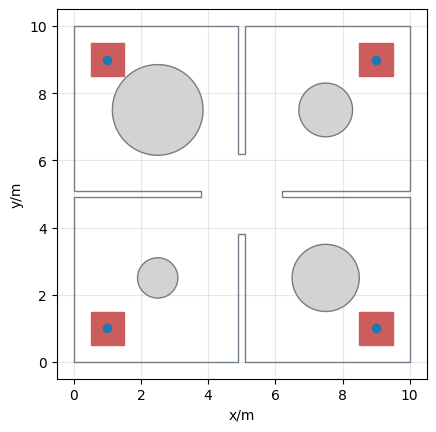

In [3]:
def create_geometry_scenario1():
    outer_boundary = Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
    corridor_walls = [
        Polygon([(4.9, 0), (5.1, 0), (5.1, 3.8), (4.9, 3.8)]),
        Polygon([(4.9, 6.2), (5.1, 6.2), (5.1, 10), (4.9, 10)]),
        Polygon([(0, 4.9), (3.8, 4.9), (3.8, 5.1), (0, 5.1)]),
        Polygon([(6.2, 4.9), (10, 4.9), (10, 5.1), (6.2, 5.1)]),
    ]

    radius = 1.0
    circular_obstacles = [
        Point(2.5, 2.5).buffer(radius - 0.4),
        Point(7.5, 2.5).buffer(radius),
        Point(2.5, 7.5).buffer(radius + 0.35),
        Point(7.5, 7.5).buffer(radius - 0.2),
    ]

    all_obstacles = corridor_walls + circular_obstacles

    geometry = outer_boundary.difference(unary_union(all_obstacles))
    return geometry


def define_positions_scenario1():
    """Define initial positions and desired speeds."""
    positions = [(1, 1), (9, 9), (1, 9), (9, 1)]
    speeds = [1.0, 1.0, 1.0, 1.0]
    return positions, speeds


def define_goals_scenario1():
    """Define goal polygons."""
    goals = [
        Polygon([(8.5, 8.5), (9.5, 8.5), (9.5, 9.5), (8.5, 9.5)]),
        Polygon([(0.5, 0.5), (1.5, 0.5), (1.5, 1.5), (0.5, 1.5)]),
        Polygon([(8.5, 0.5), (9.5, 0.5), (9.5, 1.5), (8.5, 1.5)]),
        Polygon([(0.5, 8.5), (1.5, 8.5), (1.5, 9.5), (0.5, 9.5)]),
    ]
    return goals


geometry = create_geometry_scenario1()
goals = define_goals_scenario1()
positions, speeds = define_positions_scenario1()
plot_simulation_configuration(geometry, positions, goals)
times_dict = {}

### CSM Simulation


In [4]:
model = "CSM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.CollisionFreeSpeedModelV2(),
    jps.CollisionFreeSpeedModelV2State,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 13.43 s


### AVM Simulation


In [5]:
model = "AVM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.AnticipationVelocityModel(rng_seed=42),
    jps.AnticipationVelocityModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 13.82 s


### SFM Simulation


In [6]:
model = "SFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.SocialForceModel(),
    jps.SocialForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 24.16 s


### GCFM Simulation


In [7]:
model = "GCFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.GeneralizedCentrifugalForceModel(),
    jps.GeneralizedCentrifugalForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 32.01 s


### WD Simulation

In [8]:
model = "WD"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.WarpDriverModel(),
    jps.WarpDriverModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 14.36 s


### CrowdRL Simulation (learned policy)


In [9]:
model = "CrowdRL"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    crowdrl_model(geometry),
    CrowdRLAgentState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)


Evacuation time: 13.68 s


### Evacuation times


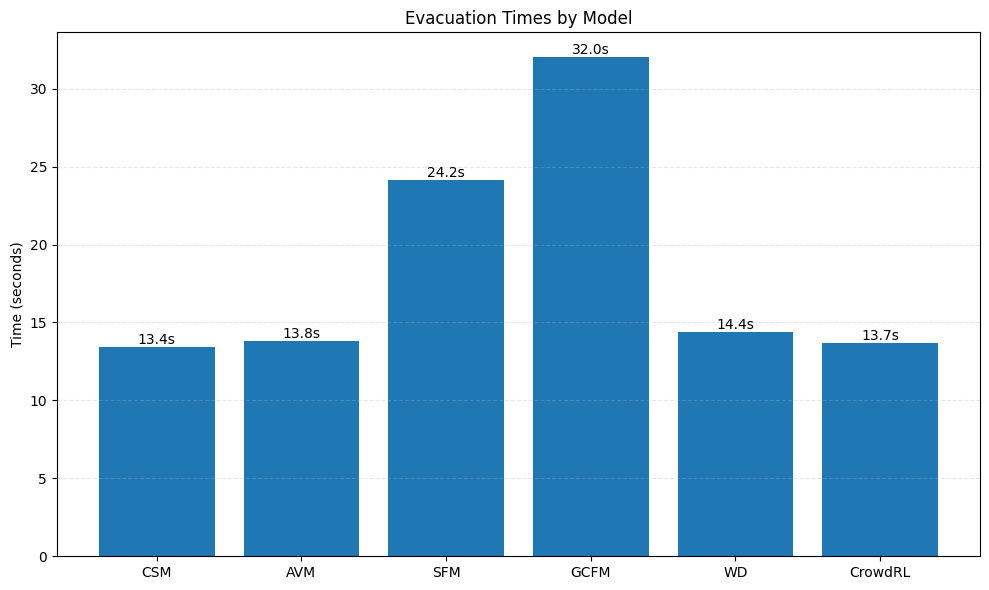

In [10]:
fig = plot_evacuation_times(times_dict)
plt.show()

## Scenario 2: Following Behavior

A single-line setup where one agent follows another slower-moving agent, testing how the models handle speed adjustments and eventually overtaking.


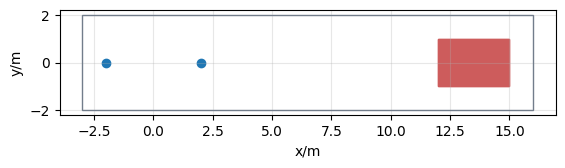

In [11]:
def create_geometry_scenario2():
    geometry = Polygon([(-3, -2), (16, -2), (16, 2), (-3, 2)])
    return geometry


def define_positions_scenario2():
    """Define initial positions and desired speeds."""
    positions = [
        (-2, 0),
        (2, 0),
    ]
    speeds = [
        1.0,
        0.0,
    ]
    return positions, speeds


def define_goals_scenario2():
    """Define goal polygons."""
    goals = [
        Polygon([(12, -1), (15, -1), (15, 1), (12, 1)]),
        Polygon([(12, -1), (15, -1), (15, 1), (12, 1)]),
    ]
    return goals


geometry = create_geometry_scenario2()
positions, speeds = define_positions_scenario2()
goals = define_goals_scenario2()
plot_simulation_configuration(geometry, positions, goals)
times_dict = {}

### CSM Simulation


In [12]:
model = "CSM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.CollisionFreeSpeedModelV2(),
    jps.CollisionFreeSpeedModelV2State,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### AVM Simulation


In [13]:
model = "AVM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.AnticipationVelocityModel(rng_seed=42),
    jps.AnticipationVelocityModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### SFM Simulation


In [14]:
model = "SFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.SocialForceModel(),
    jps.SocialForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### GCFM Simulation


In [15]:
model = "GCFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.GeneralizedCentrifugalForceModel(),
    jps.GeneralizedCentrifugalForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### WD Simulation

In [16]:
model = "WD"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.WarpDriverModel(),
    jps.WarpDriverModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### CrowdRL Simulation (learned policy)


In [17]:
model = "CrowdRL"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    crowdrl_model(geometry),
    CrowdRLAgentState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)


Evacuation time: 20.00 s


## Scenario 3: Head-on Encounter

Two agents approach each other on a straight line, evaluating how different models resolve direct confrontation and determine which agent yields or how they negotiate passing space.


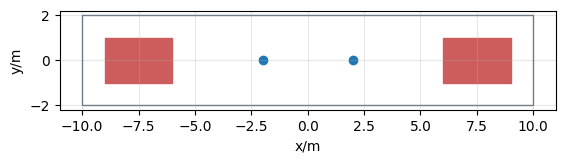

In [18]:
def create_geometry_scenario3():
    geometry = Polygon([(-10, -2), (10, -2), (10, 2), (-10, 2)])
    return geometry


def define_positions_scenario3():
    """Define initial positions and desired speeds."""
    positions = [
        (-2, 0),
        (2, 0),
    ]
    speeds = [
        1.0,
        1.0,
    ]
    return positions, speeds


def define_goals_scenario3():
    """Define goal polygons."""
    goals = [
        Polygon([(6, -1), (9, -1), (9, 1), (6, 1)]),
        Polygon([(-9, -1), (-6, -1), (-6, 1), (-9, 1)]),
    ]
    return goals


geometry = create_geometry_scenario3()
positions, speeds = define_positions_scenario3()
goals = define_goals_scenario3()
plot_simulation_configuration(geometry, positions, goals)
times_dict = {}

### CSM Simulation


In [19]:
model = "CSM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.CollisionFreeSpeedModelV2(),
    jps.CollisionFreeSpeedModelV2State,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### AVM Simulation


In [20]:
model = "AVM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.AnticipationVelocityModel(rng_seed=42),
    jps.AnticipationVelocityModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 8.22 s


### SFM Simulation


In [21]:
model = "SFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.SocialForceModel(),
    jps.SocialForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### GCFM Simulation


In [22]:
model = "GCFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.GeneralizedCentrifugalForceModel(),
    jps.GeneralizedCentrifugalForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=5000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 26.77 s


### WD Simulation

In [23]:
model = "WD"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.WarpDriverModel(),
    jps.WarpDriverModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 8.55 s


### CrowdRL Simulation (learned policy)


In [24]:
model = "CrowdRL"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    crowdrl_model(geometry),
    CrowdRLAgentState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)


Evacuation time: 8.08 s


### Evacuation times

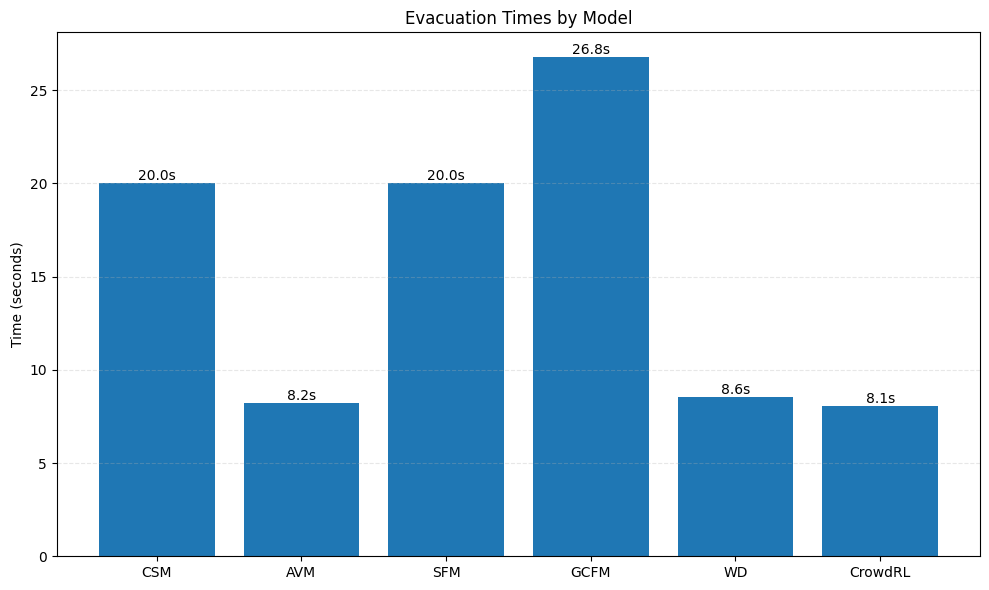

In [25]:
fig = plot_evacuation_times(times_dict)
plt.show()

## Scenario 4: Perpendicular Crossing

Two agents move on intersecting paths - one traveling upward and another moving left to right - creating a potential collision point. This tests how models handle collision avoidance when agents approach at right angles.


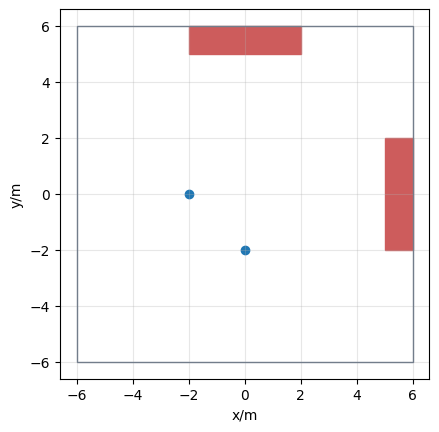

In [26]:
def create_geometry_scenario4():
    geometry = Polygon([(-6, -6), (6, -6), (6, 6), (-6, 6)])
    return geometry


def define_positions_scenario4():
    """Define initial positions and desired speeds."""
    positions = [(-2, 0), (0, -2)]
    speeds = [1.0, 0.99]
    return positions, speeds


def define_goals_scenario4():
    """Define goal polygons."""
    goals = [
        Polygon([(5, -2), (6, -2), (6, 2), (5, 2)]),
        Polygon([(-2, 5), (-2, 6), (2, 6), (2, 5)]),
    ]
    return goals


geometry = create_geometry_scenario4()
positions, speeds = define_positions_scenario4()
goals = define_goals_scenario4()
plot_simulation_configuration(geometry, positions, goals)
times_dict = {}

### CSM Simulation


In [27]:
model = "CSM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.CollisionFreeSpeedModelV2(),
    jps.CollisionFreeSpeedModelV2State,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 9.33 s


### AVM Simulation


In [28]:
model = "AVM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.AnticipationVelocityModel(rng_seed=42),
    jps.AnticipationVelocityModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 7.72 s


### SFM Simulation


In [29]:
model = "SFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.SocialForceModel(),
    jps.SocialForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 10.20 s


### GCFM Simulation


In [30]:
model = "GCFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.GeneralizedCentrifugalForceModel(),
    jps.GeneralizedCentrifugalForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 12.99 s


### WD Simulation

In [31]:
model = "WD"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.WarpDriverModel(),
    jps.WarpDriverModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 8.17 s


### CrowdRL Simulation (learned policy)


In [32]:
model = "CrowdRL"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    crowdrl_model(geometry),
    CrowdRLAgentState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)


Evacuation time: 7.16 s


### Evacuation times

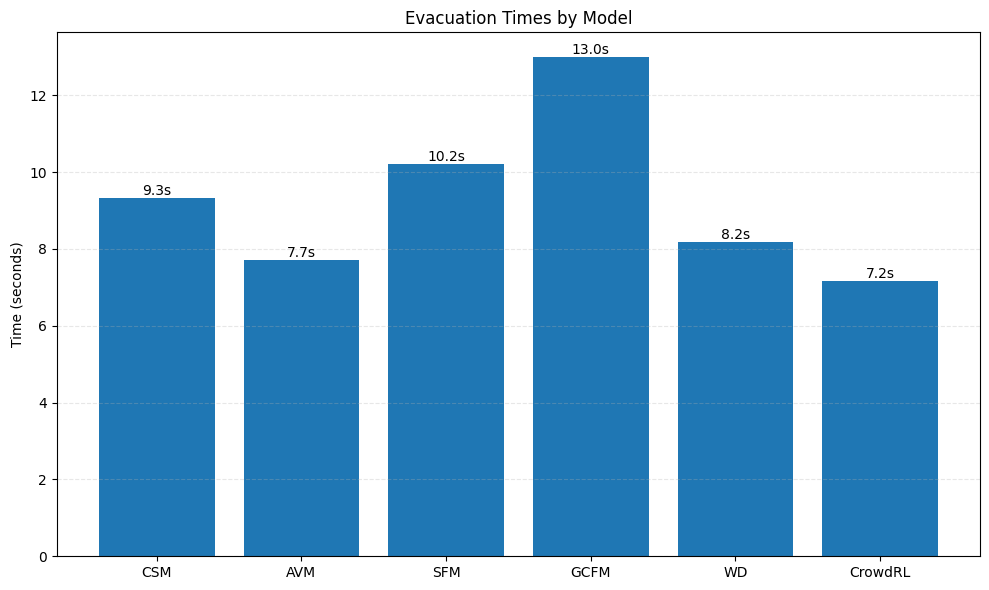

In [33]:
fig = plot_evacuation_times(times_dict)
plt.show()

## Scenario 5: Movement of individuals in a bottleneck

Agents are initialized in a semicircular formation surrounding a bottleneck. For reference, see [this experiment](https://ped.fz-juelich.de/da/doku.php?id=bottleneck_individuals).

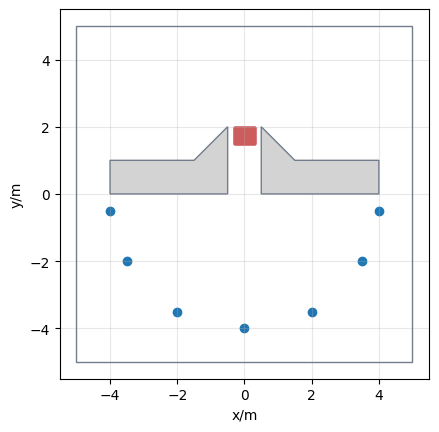

In [34]:
def create_geometry_scenario5():
    # Outer boundary
    outer = [(-5, -5), (5, -5), (5, 5), (-5, 5)]

    # Inner holes (from the second polygon)
    hole1 = [(0.5, 0), (4.0, 0), (4.0, 1), (1.5, 1), (0.5, 2), (0.5, 0)]
    hole2 = [(-0.5, 0), (-4.0, 0), (-4.0, 1), (-1.5, 1), (-0.5, 2), (-0.5, 0)]

    # Create polygon with holes
    geometry = Polygon(shell=outer, holes=[hole1, hole2])
    return geometry


def define_positions_scenario5():
    """Define initial positions and desired speeds."""
    positions = [
        (-4, -0.5),
        (-3.5, -2),
        (-2, -3.5),
        (0, -4),
        (2, -3.5),
        (3.5, -2),
        (4, -0.5),
    ]
    speeds = 7 * [1.0]
    return positions, speeds


def define_goals_scenario5():
    """Define 7 goals polygons."""
    goals = 7 * [Polygon([(-0.3, 1.5), (0.3, 1.5), (0.3, 2.0), (-0.3, 2)])]
    return goals


geometry = create_geometry_scenario5()
positions, speeds = define_positions_scenario5()
goals = define_goals_scenario5()
plot_simulation_configuration(geometry, positions, goals)
times_dict = {}

### CSM Simulation


In [35]:
model = "CSM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.CollisionFreeSpeedModelV2(),
    jps.CollisionFreeSpeedModelV2State,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 10.18 s


### AVM Simulation


In [36]:
model = "AVM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.AnticipationVelocityModel(rng_seed=42),
    jps.AnticipationVelocityModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 12.59 s


### SFM Simulation


In [37]:
model = "SFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.SocialForceModel(),
    jps.SocialForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### GCFM Simulation

In [38]:
model = "GCFM"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.GeneralizedCentrifugalForceModel(),
    jps.GeneralizedCentrifugalForceModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 20.00 s


### WD Simulation

In [39]:
model = "WD"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    jps.WarpDriverModel(),
    jps.WarpDriverModelState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)

Evacuation time: 9.47 s


### CrowdRL Simulation (learned policy)


In [40]:
model = "CrowdRL"
trajectory_file = str(OUT_DIR / f"{model}.sqlite")
simulation = initialize_simulation(
    crowdrl_model(geometry),
    CrowdRLAgentState,
    geometry,
    goals,
    positions,
    speeds,
    trajectory_file,
)
times_dict[model] = run_simulation(simulation, max_iterations=2000)
trajectories, walkable_area = read_sqlite_file(trajectory_file)
animate(
    trajectories,
    walkable_area,
    title_note=model,
    every_nth_frame=5,
    width=width,
    height=height,
)


Evacuation time: 6.49 s


### Evacuation times

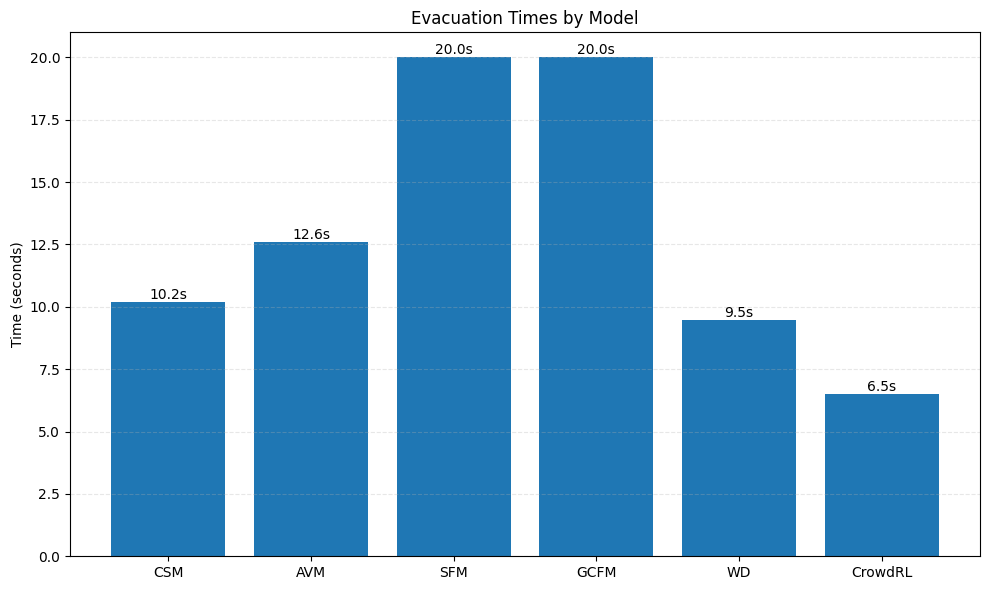

In [41]:
fig = plot_evacuation_times(times_dict)
plt.show()